# Twitter Sentiment Analysis

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import nltk
import itertools
import copy
import re
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC
from sklearn.svm import SVC
from sklearn.naive_bayes import BernoulliNB
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score
from tokenize import tokenize
from sklearn.model_selection import GridSearchCV
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer
from nltk.corpus import stopwords as sw
from nltk.tokenize import word_tokenize
from nltk.classify import SklearnClassifier
from wordcloud import WordCloud
import joblib
from sklearn import preprocessing
from matplotlib import pyplot

## Read the dataset and show some basic information

(224994, 6)
sentiment    0
ids          0
date         0
flag         0
user         0
text         0
dtype: int64


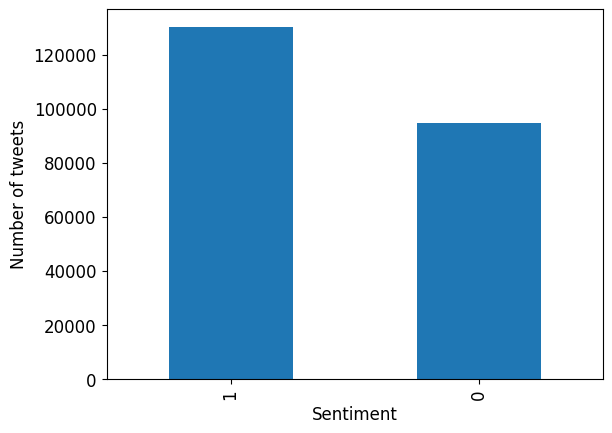

In [3]:
df=pd.read_csv('development.csv')

#The dataset is more than 220k lines and there are no NaNs
print(df.shape)
print(df.isna().sum())

#bar plot to show if negative and positive sentiments are balanced in number
plt.rc('font', size=12)
plt.xlabel('Sentiment')
plt.ylabel('Number of tweets')
df.sentiment.value_counts().plot.bar()
pyplot.savefig("ntweets.pdf")

## Users as words
The number of users is much smaller than the dimension of the dataset so most of the users wrote more than 1 tweet.
It could be useful to see if some users have a tendency to write \"positive\" tweets and others \"negative\" tweets.
If this happens to be the case we can mantain the infomation about some users that have a more
accentuated tendency to write one type of tweet or the other.

10647


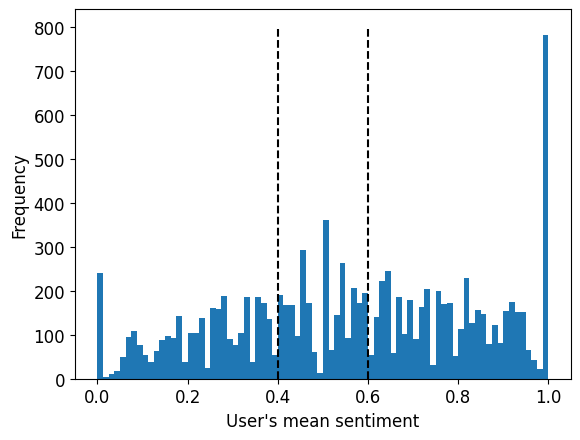

In [4]:
print(len(np.unique(df.user)))
df_users = df.groupby('user')
plt.xlabel("User's mean sentiment")
df_users.sentiment.mean().plot.hist(bins=80)
plt.vlines(x=0.4, ymin=0, ymax=800, color = 'black', linestyles="dashed")
plt.vlines(x=0.6, ymin=0, ymax=800, color = 'black', linestyles="dashed")
pyplot.savefig("usersHist.pdf")

## Days of the week as words

In [5]:
df3=pd.read_csv('development.csv')

#Weekdays could also play an important role so we will include them
week_days = []
for el in df3['date']:
    week_days.append(el.split()[0])
    
#show how many positive and negative tweets there are per each week day
labels = ['Mon','Tue','Wed','Thu','Fri','Sat','Sun']
df3['data'] = week_days
pos_day=[]
neg_day=[]
for label in labels:
    df_days = df3.loc[df3.data==label]
    pos_day.append(df_days.sentiment.sum())
    neg_day.append(df_days.shape[0]-df_days.sentiment.sum())


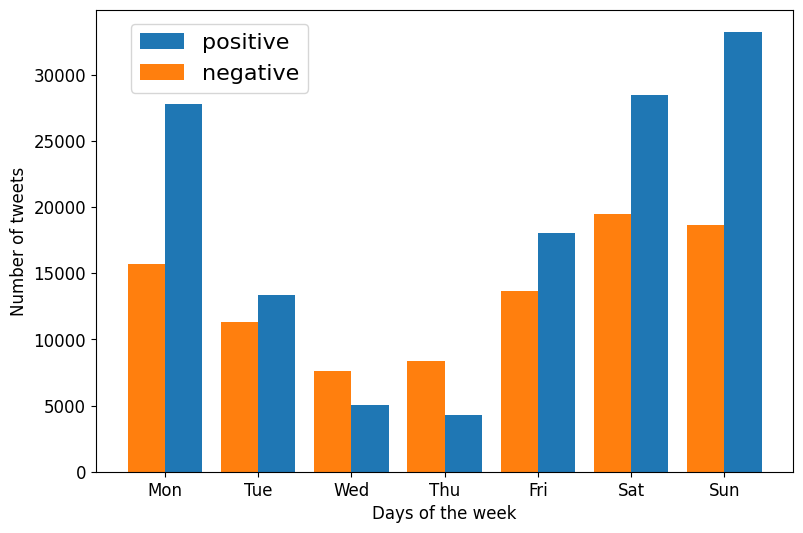

In [6]:
x = np.arange(7)
width = 0.4
fig, ax = plt.subplots(figsize=(9,6))
plt.rc('font', size=16)
ax.bar(x+width/2, pos_day, width=width, label='positive')
ax.bar(x-width/2, neg_day, width=width, label='negative')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend(loc=(0.05,0.82))
plt.xlabel('Days of the week')
plt.ylabel('Number of tweets')
pyplot.savefig("daysofweek.pdf")

In [7]:
df3=pd.read_csv('development.csv')

#copy usernames and weekdays in the text and use them as words
df3['text'] = df3['text'] + " " + df3['user'] + " " + week_days

#I can try to have a more Balanced dataset
df_negative = df3.loc[df3['sentiment']==0]
df_positive = df3.loc[df3['sentiment']==1]
df_positive = df_positive.sample(n=len(df_negative))
df3 = pd.concat([df_negative,df_positive])
df3 = df3.sample(frac=1, random_state=1)
del df_negative, df_positive

## Preprocessing: cleaning the text
- remove_patterns: removes some regular expressions such as tags (starting with '@'), links, punctuation and numbers
- normalize_stopwords: used to stem and lemmatize stopwords since later I will do the same with the tweets' text
- clean_repeating_chars: removes repeating characters so that words like "aaarghh" all become "argh"

In [8]:
lemmatizer = WordNetLemmatizer()
porter_stemmer = PorterStemmer()

def remove_pattern(input_txt):
    input_txt = re.sub("@\\w+ *",' ', input_txt) #mentions
    input_txt = re.sub(r'http\S+',' ', input_txt) #links
    #input_txt = re.sub(r'[^\w\s]',' ', input_txt) #punctuation
    input_txt = re.sub(r'[0-9]', ' ', input_txt) #numbers
    return input_txt

def normalize_stopwords(stopw):
    normalized_stopwords = []
    for item in stopw:
        temp=porter_stemmer.stem(item)
        temp=lemmatizer.lemmatize(temp)
        normalized_stopwords.append(temp)
    return normalized_stopwords

def clean_repeating_chars(input_txt):
    return ''.join(c[0] for c in itertools.groupby(input_txt))

#Finally i define a personalized tokenizer that also lemmatizes every word
def my_tokenize(text):
    tokens = nltk.word_tokenize(text)
    toks = []
    for item in tokens:
        if len(item)>1 and len(item)<16:
            temp=porter_stemmer.stem(item)
            temp=lemmatizer.lemmatize(temp)
            toks.append(temp)
    return toks

In [12]:
df3['text'] = np.vectorize(remove_pattern)(df3['text'])
df3['text'] = df3['text'].str.lower() #convert everything to lowercase
df3['text'] = df3['text'].apply(lambda text: clean_repeating_chars(text))

#normalize stopwords and add some custom words to the list
stopwords=normalize_stopwords(sw.words('english'))
my_stopwords = copy.deepcopy(stopwords)
my_stopwords = list(np.unique(my_stopwords)) #making sure stopwords in the list are unique
add_stopwords = ['r', 'amp','yall','neutral', 'quot','wo','would','v','sha',"n't","'","'d","'ll",'becau','could','might','must','need']
my_stopwords = my_stopwords + add_stopwords    #final list of stopwords for the tfidf

#Now I delete columns that don't give us any infomation
del df3['ids']
del df3['date']
del df3['flag']
del df3['user']

#Rename the columns of the dataset because they are called "sentiment" and "text" which are very common words and could be in some tweets.
df3.columns = ['sentiment_df3', 'text_df3']

## Tokenize

In [13]:
vectorizer = TfidfVectorizer(max_features=25000, tokenizer=my_tokenize)          #performs best WITHOUT removing stopwords
X = vectorizer.fit_transform(df3['text_df3'])                #questa è la X
joblib.dump(vectorizer, "vectorizer.pkl") 
vectorizer= joblib.load("vectorizer.pkl") 
y=df3['sentiment_df3']

## WordClouds

In [14]:
df_all = pd.read_csv("development.csv")
y = df_all['sentiment'] #y now contains the sentiments of the dataset
del df_all['ids']
del df_all['user']
del df_all['date']
del df_all['flag']
del df_all['sentiment']
df_all['text'] = np.vectorize(remove_pattern)(df_all['text'])
df_all['text'] = df_all['text'].str.lower() #convert everything to lowercase
#I need to create a dataframe for the wordclouds
N=3000
vectorizer = TfidfVectorizer(stop_words=sw.words('english')+['wasnt'])
vectorized_text = vectorizer.fit_transform(df_all['text'])
freq = sorted(zip(vectorizer.get_feature_names(),vectorized_text.sum(axis=0).tolist()[0]),key=lambda x: x[1],reverse=True)[0:N]
words = [ word for word, _ in freq ]
mask = [ w in words for w in vectorizer.get_feature_names() ]
df_all = pd.DataFrame(data=vectorized_text[:, np.array(mask)].toarray(),columns=[f"{word}" for word in words],index=df_all.index)

C:\Users\scole\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [15]:
# df_all = X.copy()
df_all.insert(0, 'sentiment_df3', list(y))
df_negative = df_all.loc[df_all['sentiment_df3']==0]    #dataset with only negative tweets
df_positive = df_all.loc[df_all['sentiment_df3']==1]    #dataset with only negative tweets
del df_negative['sentiment_df3']                
del df_positive['sentiment_df3']
del df_all 

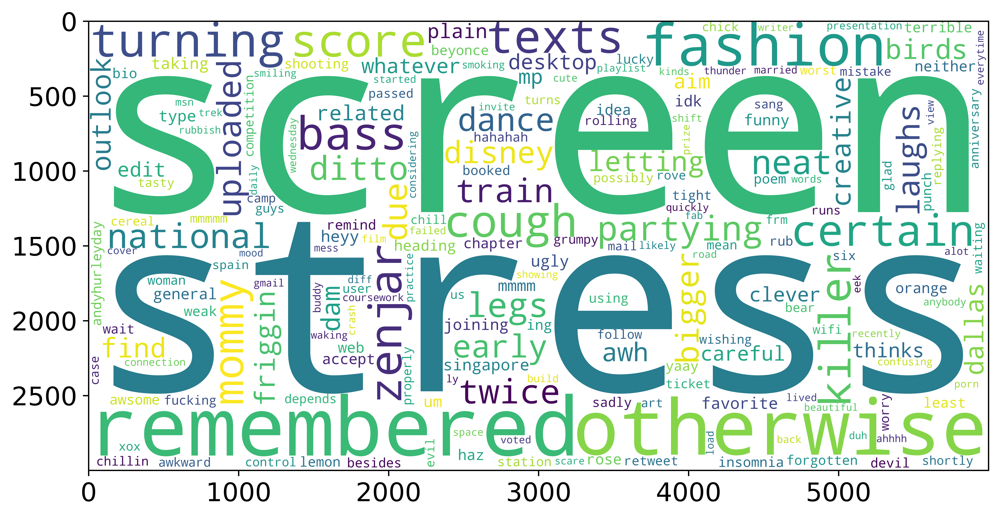

In [16]:
#let's show words from negative tweets
diz_neg={}
for a,b in sorted(zip(df_negative.columns,df_negative.sum(axis=0).tolist()), key = lambda x: x[1], reverse=True):
    diz_neg[a]=b
    
wc = WordCloud(width=6000, height=3000, background_color="white").generate_from_frequencies(diz_neg)
fig, ax = plt.subplots(figsize=(10, 6), dpi=1000)
ax.imshow(wc)
pyplot.savefig("negativeWC.pdf")

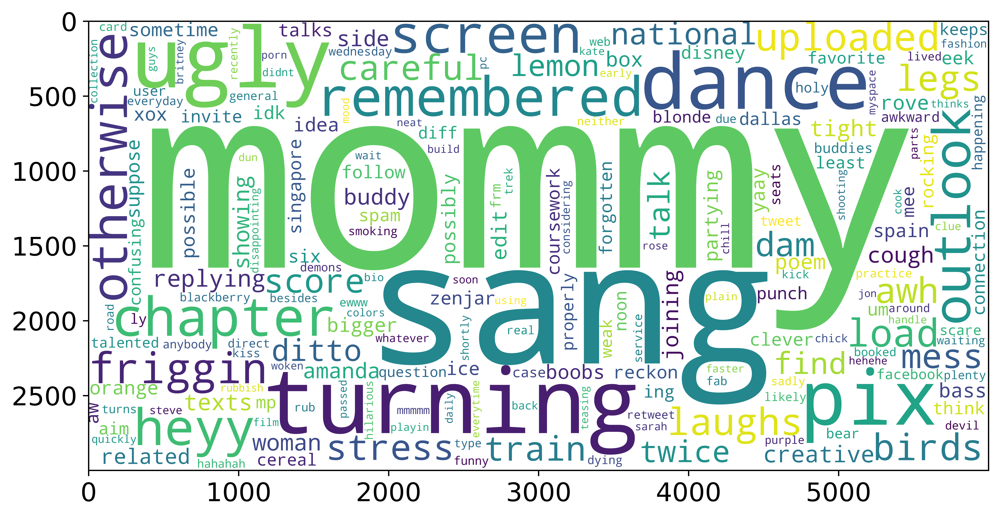

In [17]:
#and now from positive tweets
diz_pos={}
for a,b in sorted(zip(df_positive.columns,df_positive.sum(axis=0).tolist()), key = lambda x: x[1], reverse=True):
    diz_pos[a]=b
    
wc2 = WordCloud(width=6000, height=3000, background_color="white").generate_from_frequencies(diz_pos)
fig, ax = plt.subplots(figsize=(10, 6), dpi=1000)
ax.imshow(wc2)
pyplot.savefig("positiveWC.pdf")

## Grid search on max_features

In [ ]:
del df3
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [ ]:
#vectors with f1 scores calculated on test set (develompment) with increasing number of features
svc_scores = []
lr_scores = []
max_features = [500, 1000, 2000, 4000, 8000, 16000, 32000]

for el in max_features:
    vectorizer = TfidfVectorizer(max_features=el, tokenizer=my_tokenize, stop_words=['and','or','quot','amp']) 
    X = vectorizer.fit_transform(df3['text_df3'])
    y=df3['sentiment_df3']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    
    #LINEAR SVC
    lsvc = LinearSVC()
    lsvc.fit(X_train,y_train)
    y_pred1 = lsvc.predict(X_test)
    svc_scores.append(f1_score(y_test, y_pred1, average='macro'))
    
    #LOGISTIC REGRESSION
    lr = LogisticRegression()
    lr.fit(X_train,y_train)
    y_pred2 = lr.predict(X_test)
    lr_scores.append(f1_score(y_test, y_pred2, average='macro'))

[0.759428707655315, 0.7745553973084154, 0.7829330825875453, 0.7929613461508342, 0.802347360677648, 0.813401429701023, 0.8125931855496804]
[0.7595277732924179, 0.7745708240151452, 0.7832235463778489, 0.7944563947240568, 0.8029099504858395, 0.8115031932970167, 0.8122903176299208]


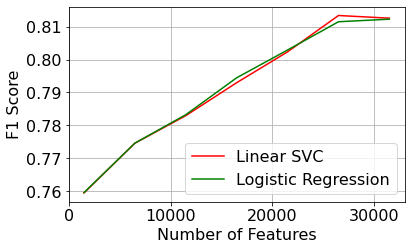

In [48]:
print(svc_scores)
print(lr_scores)
X_plot=np.arange(1500,32000,5000)
plt.plot(X_plot, svc_scores, color='r', label='Linear SVC')
plt.plot(X_plot, lr_scores, color='g', label='Logistic Regression')
plt.xlabel("Number of Features")
plt.ylabel("F1 Score")
plt.legend()
plt.grid()
plt.tight_layout()
plt.subplots_adjust(top=0.88)
pyplot.savefig("f1_score.pdf")

## Grid Search on model's hyperparameters

In [ ]:
#I use the function seen in labs called build classifier to perform the grid Search with different parameters
#I perform the grid search on the hyperparameters based on which number of feature performed the best for both models

def build_classifier(X_train, y_train, X_test, y_test, clf_to_evaluate, score, param_grid, n_folds=3 ):
    print("# Tuning hyper-parameters for %s" % score)
    print()
    clf = GridSearchCV(clf_to_evaluate, param_grid, cv=n_folds,scoring=score, verbose=True, n_jobs=4)
    clf.fit(X_train, y_train)
    print("Best parameters set found on development set:")
    print()
    print(clf.best_params_)
    print()
    print("Grid scores on development set:")
    print()
    means = clf.cv_results_['mean_test_score']
    stds = clf.cv_results_['std_test_score']
    for mean, std, params in zip(means, stds, clf.cv_results_['params']):
        print("%0.3f (+/-%0.03f) for %r" % (mean, std * 2, params))
        
    print()
    print("Detailed classification report:")
    print()
    print("The model is trained on the full development set.")
    print("The scores are computed on the full evaluation set.")
    print()
    y_true, y_pred = y_test, clf.predict(X_test)
    print(classification_report(y_true, y_pred))
    print()
    return clf

In [ ]:
penalty = ['l1','l2']
dual = [True,False]
max_iter = [1000,2000]
C = [0.1, 1, 10, 100]
params_grid = {
    'penalty' : penalty,
    'dual' : dual,
    'max_iter' : max_iter,
    'C' : C
}

In [ ]:
score = 'f1_macro'
rf_to_evaluate = LinearSVC()
best_nb = build_classifier(X_train, y_train, X_test, y_test, rf_to_evaluate, score, params_grid) #returns best trained model

#best returned configuration is C=1, dual=False, max_iter=2000, penalty=l1
#f1_score = 

In [ ]:
penalty2 = ['l1','l2']
dual2 = [True,False]
max_iter2 = [100,150,200]
C2 = [1,4,8]
params_grid2 = {
    'penalty' : penalty2,
    'dual' : dual2,
    'max_iter' : max_iter2,
    'C' : C2
}

In [ ]:
score = 'f1_macro'
rf_to_evaluate2 = LogisticRegression()
best_nb2 = build_classifier(X_train, y_train, X_test, y_test, rf_to_evaluate2, score, params_grid2) #returns best trained model

#best returned configuration is {'C': 4, 'dual': False, 'max_iter': 100, 'penalty': 'l2'}

In [54]:
#CHECK F1 SCORE WITH DEVELOPMENT TRAIN/TEST SPLIT
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [55]:
lr = LogisticRegression(dual=False, max_iter=150, n_jobs=-1, C=4, penalty = 'l2')
lr.fit(X_train,y_train)
y_pred_lr = lr.predict(X_test)
f1_lr = f1_score(y_pred_lr,y_test)
print(f1_lr)        #result is 0.818

0.8183492676081047


In [56]:
lsvc = LinearSVC(dual=False, max_iter=2000, penalty='l1', C=1)
lsvc.fit(X_train,y_train)
y_pred_lsvc = lsvc.predict(X_test)
f1_lsvc = f1_score(y_pred_lsvc,y_test)
print(f1_lsvc)        #result is 0.815

0.8150151943649107


In [57]:
#FINAL MODEL: Logistic Regression
final_model = LogisticRegression(dual=False, max_iter=150, n_jobs=-1, C=4, penalty = 'l2')
final_model.fit(X,y)
joblib.dump(final_model, "final_model.pkl")

['final_model.pkl']

In [9]:
#FINAL MODEL: Linear SVC
final_mdoel = LinearSVC(dual=False, max_iter=2000, penalty='l1', C=1)
final_mdoel.fit(X,y)
joblib.dump(final_model, "final_model.pkl") 

['final_model.pkl']

## Evaluation

In [58]:
df_eval = pd.read_csv('evaluation.csv')
week_days2 = []
for el in df_eval['date']:
    week_days2.append(el.split()[0])
    
df_eval['text'] = df_eval['text'] + " " + df_eval['user'] + " " + week_days2
df_eval['text'] = np.vectorize(remove_pattern)(df_eval['text'])
df_eval['text'] = df_eval['text'].str.lower()
df_eval['text'] = df_eval['text'].apply(lambda text: clean_repeating_chars(text))

del df_eval['ids']
del df_eval['date']
del df_eval['flag']
del df_eval['user']
df_eval.columns = ['text_eval']

vectorizer = joblib.load('vectorizer.pkl')
vectorized_text_eval = vectorizer.transform(df_eval['text_eval'])

final_model = joblib.load("final_model.pkl")
y_pred_eval = final_model.predict(vectorized_text_eval)

indice = df_eval.index
pd.DataFrame(dict(
    Id = indice,
    Predicted = y_pred_eval
)).to_csv("submission.csv",sep=",",index=False)